In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


Enhanced and saved image /content/drive/My Drive/edge_detecting/data/enhanced/08_hazy_1.png.
Enhanced and saved image /content/drive/My Drive/edge_detecting/data/enhanced/08_hazy_2.png.
Enhanced and saved image /content/drive/My Drive/edge_detecting/data/enhanced/08_hazy_3.png.
Enhanced and saved image /content/drive/My Drive/edge_detecting/data/enhanced/19_hazy_1.png.
Enhanced and saved image /content/drive/My Drive/edge_detecting/data/enhanced/19_hazy_2.png.
Enhanced and saved image /content/drive/My Drive/edge_detecting/data/enhanced/19_hazy_3.png.
Enhanced and saved image /content/drive/My Drive/edge_detecting/data/enhanced/10_hazy_1.png.
Enhanced and saved image /content/drive/My Drive/edge_detecting/data/enhanced/10_hazy_2.png.
Enhanced and saved image /content/drive/My Drive/edge_detecting/data/enhanced/10_hazy_3.png.
Enhanced and saved image /content/drive/My Drive/edge_detecting/data/enhanced/13_hazy_1.png.
Enhanced and saved image /content/drive/My Drive/edge_detecting/data/e

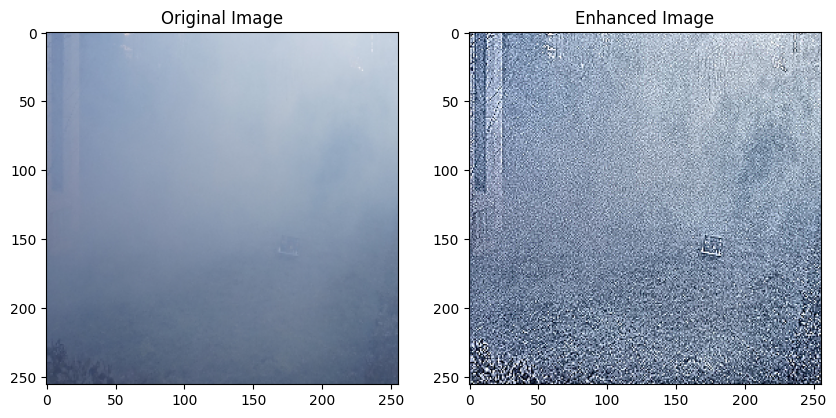

In [ ]:


# Define directory paths
import os
data_dir = '/content/drive/MyDrive/edge_detecting/data/train/hazy_images '
processed_dir = '/content/drive/My Drive/edge_detecting/data/processed/'
enhanced_dir = '/content/drive/My Drive/edge_detecting/data/enhanced/'

# Create directories if they don't exist
os.makedirs(processed_dir, exist_ok=True)
os.makedirs(enhanced_dir, exist_ok=True)

# Import necessary libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Define the preprocessing function
def preprocess_image(image_path, output_path, size=(256, 256)):
    """
    Preprocesses the image by resizing and normalizing.

    Parameters:
    - image_path: str, path to the input image.
    - output_path: str, path to save the processed image.
    - size: tuple, desired size of the output image.
    """
    # Read the image
    image = cv2.imread(image_path)

    # Check if the image is loaded correctly
    if image is None:
        print(f"Error loading image {image_path}")
        return

    # Resize the image
    resized_image = cv2.resize(image, size)

    # Normalize the image
    normalized_image = resized_image / 255.0

    # Convert back to uint8 format for saving
    save_image = (normalized_image * 255).astype(np.uint8)

    # Save the processed image
    cv2.imwrite(output_path, save_image)

# Process all images in the training directory
for filename in os.listdir(data_dir):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        input_path = os.path.join(data_dir, filename)
        output_path = os.path.join(processed_dir, filename)
        preprocess_image(input_path, output_path)

def sharpen_image(image):
    """
    Sharpens the input image.

    Parameters:
    - image: numpy array, the input image.

    Returns:
    - sharpened_image: numpy array, the sharpened image.
    """
    kernel = np.array([[0, -1, 0],
                       [-1, 5,-1],
                       [0, -1, 0]])
    sharpened_image = cv2.filter2D(image, -1, kernel)
    return sharpened_image

def adjust_contrast(image):
    """
    Adjusts the contrast of the input image using CLAHE.

    Parameters:
    - image: numpy array, the input image.

    Returns:
    - contrast_adjusted_image: numpy array, the contrast-adjusted image.
    """
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    cl = clahe.apply(l)
    limg = cv2.merge((cl,a,b))
    contrast_adjusted_image = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)
    return contrast_adjusted_image

def dehaze_image(image):
    """
    Applies a simple dehazing algorithm to the input image.

    Parameters:
    - image: numpy array, the input image.

    Returns:
    - dehazed_image: numpy array, the dehazed image.
    """
    dehazed_image = cv2.detailEnhance(image, sigma_s=10, sigma_r=0.15)
    return dehazed_image

def enhance_image(image_path, output_path):
    """
    Enhances the image by applying sharpening, contrast adjustment, and dehazing.

    Parameters:
    - image_path: str, path to the input image.
    - output_path: str, path to save the enhanced image.
    """
    try:
        # Read the image
        image = cv2.imread(image_path)

        # Check if the image is loaded correctly
        if image is None:
            print(f"Error: Could not load image {image_path}.")
            return

        # Apply enhancement techniques
        sharpened_image = sharpen_image(image)
        contrast_adjusted_image = adjust_contrast(sharpened_image)
        dehazed_image = dehaze_image(contrast_adjusted_image)

        # Save the enhanced image
        cv2.imwrite(output_path, dehazed_image)

        print(f"Enhanced and saved image {output_path}.")

    except Exception as e:
        print(f"Exception occurred while enhancing image {image_path}: {str(e)}")

# Enhance all images in the processed directory
for filename in os.listdir(processed_dir):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        input_path = os.path.join(processed_dir, filename)
        output_path = os.path.join(enhanced_dir, filename)
        enhance_image(input_path, output_path)

def display_images(original_image_path, enhanced_image_path):
    """
    Displays the original and enhanced images side by side.

    Parameters:
    - original_image_path: str, path to the original image.
    - enhanced_image_path: str, path to the enhanced image.
    """
    original_image = cv2.imread(original_image_path)
    enhanced_image = cv2.imread(enhanced_image_path)

    if original_image is None or enhanced_image is None:
        print("Error: Could not load images for display.")
        return

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.title('Original Image')
    plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))

    plt.subplot(1, 2, 2)
    plt.title('Enhanced Image')
    plt.imshow(cv2.cvtColor(enhanced_image, cv2.COLOR_BGR2RGB))

    plt.show()

# Display a sample enhanced image
sample_filename = os.listdir(processed_dir)[0]
display_images(os.path.join(processed_dir, sample_filename), os.path.join(enhanced_dir, sample_filename))

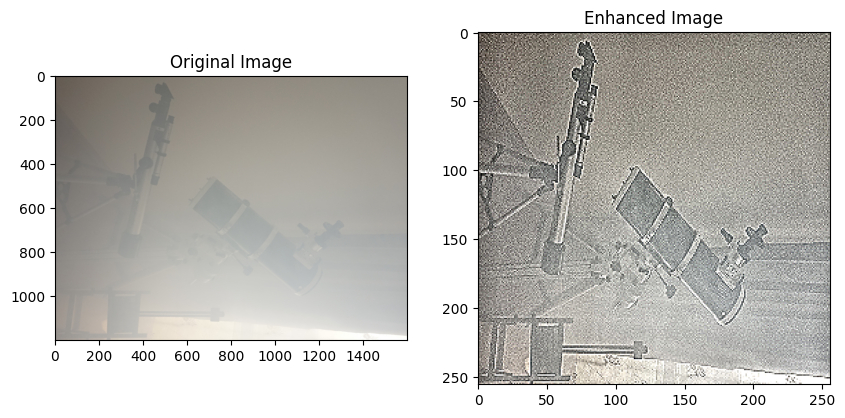

In [ ]:
import os
import random

def display_random_image(data_dir, enhanced_dir):
    """
    Displays a random pair of original and enhanced images from the specified directories.

    Parameters:
    - data_dir: str, path to the original images directory.
    - enhanced_dir: str, path to the enhanced images directory.
    """
    # Get list of files in the enhanced directory
    enhanced_files = [f for f in os.listdir(enhanced_dir) if f.endswith('.jpg') or f.endswith('.png')]

    # Choose a random file
    random_filename = random.choice(enhanced_files)

    # Display the pair of images
    display_images(os.path.join(data_dir, random_filename), os.path.join(enhanced_dir, random_filename))

# Display a random enhanced image each time the code is executed
display_random_image(data_dir, enhanced_dir)

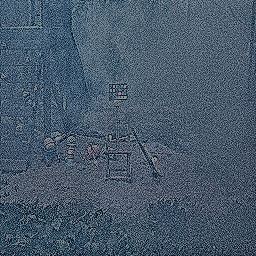

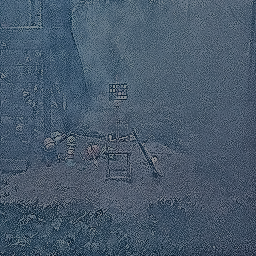

In [ ]:
import cv2
import os
import random
from google.colab.patches import cv2_imshow

def display_random_image(data_dir, enhanced_dir):
    """
    Displays a random pair of original and enhanced images from the specified directories.

    Parameters:
    - data_dir: str, path to the original images directory.
    - enhanced_dir: str, path to the enhanced images directory.
    """
    # Get list of files in the enhanced directory
    enhanced_files = os.listdir(enhanced_dir)

    # Choose a random file
    random_filename = random.choice(enhanced_files)

    # Load the enhanced image
    enhanced_image = cv2.imread(os.path.join(enhanced_dir, random_filename))

    # Add a little black color to the enhanced image
    black_image = np.zeros(enhanced_image.shape, dtype=np.uint8)
    enhanced_image = cv2.addWeighted(enhanced_image, 0.6, black_image, 0.5, 0)

    # Denoise the image
    denoised_image = cv2.bilateralFilter(enhanced_image, 9, 75, 75)

    # Display the enhanced image
    cv2_imshow(enhanced_image)
    print("\n")
    cv2_imshow(denoised_image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

# Display a random enhanced image each time the code is executed
display_random_image(data_dir, enhanced_dir)

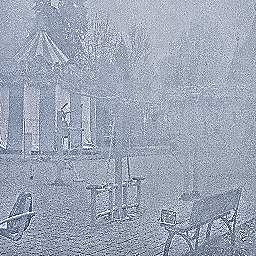

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load the image
image = cv2.imread('/content/drive/MyDrive/edge_detecting/data/processed/12_hazy_2.png')

# Sharpen the image
sharpened_image = cv2.filter2D(image, -1, np.array([[0, -1, 0],
                                                 [-1, 5,-1],
                                                 [0, -1, 0]]))

# Adjust the contrast
lab = cv2.cvtColor(sharpened_image, cv2.COLOR_BGR2LAB)
l, a, b = cv2.split(lab)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
cl = clahe.apply(l)
limg = cv2.merge((cl,a,b))
contrast_adjusted_image = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)

# Dehaze the image
dehazed_image = cv2.detailEnhance(contrast_adjusted_image, sigma_s=10, sigma_r=0.15)

# Denoise the image
denoised_image = cv2.bilateralFilter(dehazed_image, 9, 75, 75)

# Display the enhanced image
cv2_imshow(denoised_image)

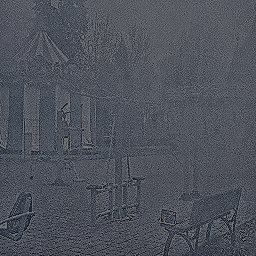

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load the image
image = cv2.imread('/content/drive/MyDrive/edge_detecting/data/processed/12_hazy_2.png')

# Sharpen the image
sharpened_image = cv2.filter2D(image, -1, np.array([[0, -1, 0],
                                                 [-1, 5,-1],
                                                 [0, -1, 0]]))

# Adjust the contrast
lab = cv2.cvtColor(sharpened_image, cv2.COLOR_BGR2LAB)
l, a, b = cv2.split(lab)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
cl = clahe.apply(l)
limg = cv2.merge((cl,a,b))
contrast_adjusted_image = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)

# Dehaze the image
dehazed_image = cv2.detailEnhance(contrast_adjusted_image, sigma_s=10, sigma_r=0.15)

# Denoise the image
denoised_image = cv2.bilateralFilter(dehazed_image, 9, 75, 75)

# Add black color
black_image = np.zeros(denoised_image.shape, dtype=np.uint8)
black_image = cv2.addWeighted(denoised_image, 0.5, black_image, 1, 0)

# Display the enhanced image
cv2_imshow(black_image)

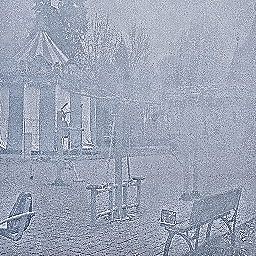

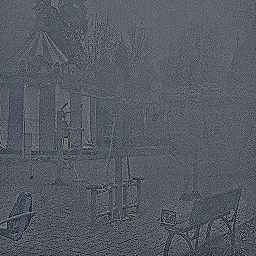

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load the image
image = cv2.imread('/content/drive/MyDrive/edge_detecting/data/processed/12_hazy_2.png')

# Sharpen the image
sharpened_image = cv2.filter2D(image, -1, np.array([[0, -1, 0],
                                                 [-1, 5,-1],
                                                 [0, -1, 0]]))

# Adjust the contrast
lab = cv2.cvtColor(sharpened_image, cv2.COLOR_BGR2LAB)
l, a, b = cv2.split(lab)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
cl = clahe.apply(l)
limg = cv2.merge((cl,a,b))
contrast_adjusted_image = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)

# Dehaze the image
dehazed_image = cv2.detailEnhance(contrast_adjusted_image, sigma_s=10, sigma_r=0.15)

# Denoise the image
denoised_image = cv2.bilateralFilter(dehazed_image, 9, 75, 75)

# Add black color
black_image = np.zeros(denoised_image.shape, dtype=np.uint8)
black_image = cv2.addWeighted(denoised_image, 0.5, black_image, 0.5, 0)

# Add contrast
contrast_image = cv2.convertScaleAbs(black_image, alpha=2, beta=0)

black_image1 = np.zeros(contrast_image.shape, dtype=np.uint8)
black_image1 = cv2.addWeighted(contrast_image, 0.5, black_image, 0, 8)

# Display the enhanced image
cv2_imshow(contrast_image)
cv2_imshow(black_image1)

In [ ]:
def sobel_edge_detection(image):
    """
    Applies Sobel edge detection to the input image.

    Parameters:
    - image: numpy array, the input image.

    Returns:
    - edges: numpy array, the image with detected edges.
    """
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    sobelx = cv2.Sobel(gray_image, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(gray_image, cv2.CV_64F, 0, 1, ksize=3)
    edges = cv2.magnitude(sobelx, sobely)
    edges = np.uint8(edges)
    return edges

def apply_edge_detection(enhanced_image_dir, edges_output_dir):
    """
    Applies edge detection to all enhanced images.

    Parameters:
    - enhanced_image_dir: str, directory containing enhanced images.
    - edges_output_dir: str, directory to save the images with detected edges.
    """
    os.makedirs(edges_output_dir, exist_ok=True)

    for filename in os.listdir(enhanced_image_dir):
        if filename.endswith('.jpg') or filename.endswith('.png'):
            image_path = os.path.join(enhanced_image_dir, filename)
            image = cv2.imread(image_path)

            if image is None:
                print(f"Error loading image {image_path}")
                continue

            edges = sobel_edge_detection(image)
            output_path = os.path.join(edges_output_dir, 'edges_' + filename)
            cv2.imwrite(output_path, edges)
            print(f"Edge detection applied and saved to {output_path}")

# Define directory for edge-detected images
edges_dir = '/content/drive/My Drive/edge_detecting/data/edges/'
apply_edge_detection(enhanced_dir, edges_dir)


Edge detection applied and saved to /content/drive/My Drive/edge_detecting/data/edges/edges_08_hazy_1.png
Edge detection applied and saved to /content/drive/My Drive/edge_detecting/data/edges/edges_08_hazy_2.png
Edge detection applied and saved to /content/drive/My Drive/edge_detecting/data/edges/edges_08_hazy_3.png
Edge detection applied and saved to /content/drive/My Drive/edge_detecting/data/edges/edges_19_hazy_1.png
Edge detection applied and saved to /content/drive/My Drive/edge_detecting/data/edges/edges_19_hazy_2.png
Edge detection applied and saved to /content/drive/My Drive/edge_detecting/data/edges/edges_19_hazy_3.png
Edge detection applied and saved to /content/drive/My Drive/edge_detecting/data/edges/edges_10_hazy_1.png
Edge detection applied and saved to /content/drive/My Drive/edge_detecting/data/edges/edges_10_hazy_2.png
Edge detection applied and saved to /content/drive/My Drive/edge_detecting/data/edges/edges_10_hazy_3.png
Edge detection applied and saved to /content/d

Enhanced and saved image /content/drive/My Drive/edge_detecting/data/enhanced/enhanced_08_hazy_1.png.
Enhanced and saved image /content/drive/My Drive/edge_detecting/data/enhanced/enhanced_10_hazy_1.png.
Enhanced and saved image /content/drive/My Drive/edge_detecting/data/enhanced/enhanced_08_hazy_3.png.
Enhanced and saved image /content/drive/My Drive/edge_detecting/data/enhanced/enhanced_19_hazy_3.png.
Enhanced and saved image /content/drive/My Drive/edge_detecting/data/enhanced/enhanced_10_hazy_3.png.
Enhanced and saved image /content/drive/My Drive/edge_detecting/data/enhanced/enhanced_13_hazy_1.png.
Enhanced and saved image /content/drive/My Drive/edge_detecting/data/enhanced/enhanced_08_hazy_2.png.
Enhanced and saved image /content/drive/My Drive/edge_detecting/data/enhanced/enhanced_19_hazy_2.png.
Enhanced and saved image /content/drive/My Drive/edge_detecting/data/enhanced/enhanced_13_hazy_2.png.
Enhanced and saved image /content/drive/My Drive/edge_detecting/data/enhanced/enha

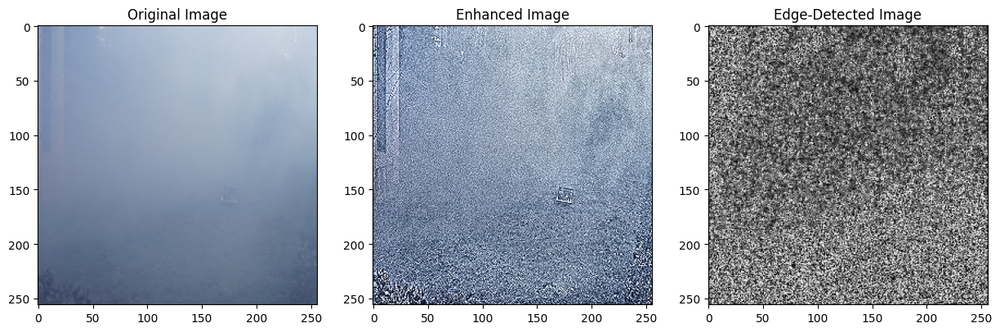

PSNR: 19.398496242039432, SSIM: 0.24780721513786322


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim

# Define directory paths
data_dir = '/content/drive/MyDrive/edge_detecting/data/train/hazy_images '
processed_dir = '/content/drive/My Drive/edge_detecting/data/processed'
enhanced_dir = '/content/drive/My Drive/edge_detecting/data/enhanced'
edges_dir = '/content/drive/My Drive/edge_detecting/data/edges'

# Create directories if they don't exist
os.makedirs(processed_dir, exist_ok=True)
os.makedirs(enhanced_dir, exist_ok=True)
os.makedirs(edges_dir, exist_ok=True)

# Check if the data directory exists
if not os.path.exists(data_dir):
    raise FileNotFoundError(f"The directory {data_dir} does not exist. Please check the path.")

# Define the preprocessing function
def preprocess_image(image_path, output_path, size=(256, 256)):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error loading image {image_path}")
        return
    resized_image = cv2.resize(image, size)
    normalized_image = resized_image / 255.0
    save_image = (normalized_image * 255).astype(np.uint8)
    cv2.imwrite(output_path, save_image)

# Process all images in the training directory
for filename in os.listdir(data_dir):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        input_path = os.path.join(data_dir, filename)
        output_path = os.path.join(processed_dir, filename)
        preprocess_image(input_path, output_path)

# Define enhancement functions
def sharpen_image(image):
    kernel = np.array([[0, -1, 0],
                       [-1, 5,-1],
                       [0, -1, 0]])
    return cv2.filter2D(image, -1, kernel)

def adjust_contrast(image):
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    cl = clahe.apply(l)
    limg = cv2.merge((cl,a,b))
    return cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)

def dehaze_image(image):
    return cv2.detailEnhance(image, sigma_s=10, sigma_r=0.15)

def enhance_image(image_path, output_path):
    try:
        image = cv2.imread(image_path)
        if image is None:
            print(f"Error: Could not load image {image_path}.")
            return
        sharpened_image = sharpen_image(image)
        contrast_adjusted_image = adjust_contrast(sharpened_image)
        dehazed_image = dehaze_image(contrast_adjusted_image)
        cv2.imwrite(output_path, dehazed_image)
        print(f"Enhanced and saved image {output_path}.")
    except Exception as e:
        print(f"Exception occurred while enhancing image {image_path}: {str(e)}")

# Enhance all images in the processed directory
for filename in os.listdir(processed_dir):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        input_path = os.path.join(processed_dir, filename)
        output_path = os.path.join(enhanced_dir, 'enhanced_' + filename)
        enhance_image(input_path, output_path)

# Define edge detection function
def sobel_edge_detection(image):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    sobelx = cv2.Sobel(gray_image, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(gray_image, cv2.CV_64F, 0, 1, ksize=3)
    edges = cv2.magnitude(sobelx, sobely)
    return np.uint8(edges)

def apply_edge_detection(enhanced_image_dir, edges_output_dir):
    os.makedirs(edges_output_dir, exist_ok=True)
    for filename in os.listdir(enhanced_image_dir):
        if filename.endswith('.jpg') or filename.endswith('.png'):
            image_path = os.path.join(enhanced_image_dir, filename)
            image = cv2.imread(image_path)
            if image is None:
                print(f"Error loading image {image_path}")
                continue
            edges = sobel_edge_detection(image)
            output_path = os.path.join(edges_output_dir, 'edges_' + filename)
            cv2.imwrite(output_path, edges)
            print(f"Edge detection applied and saved to {output_path}")

apply_edge_detection(enhanced_dir, edges_dir)

# Display a sample enhanced image
def display_images(original_image_path, enhanced_image_path, edge_detected_image_path):
    original_image = cv2.imread(original_image_path)
    enhanced_image = cv2.imread(enhanced_image_path)
    edge_detected_image = cv2.imread(edge_detected_image_path, cv2.IMREAD_GRAYSCALE)

    if original_image is None or enhanced_image is None or edge_detected_image is None:
        print("Error: Could not load images for display.")
        return

    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.title('Original Image')
    plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))

    plt.subplot(1, 3, 2)
    plt.title('Enhanced Image')
    plt.imshow(cv2.cvtColor(enhanced_image, cv2.COLOR_BGR2RGB))

    plt.subplot(1, 3, 3)
    plt.title('Edge-Detected Image')
    plt.imshow(edge_detected_image, cmap='gray')

    plt.show()

sample_filename = os.listdir(processed_dir)[0]
display_images(os.path.join(processed_dir, sample_filename),
               os.path.join(enhanced_dir, 'enhanced_' + sample_filename),
               os.path.join(edges_dir, 'edges_' + 'enhanced_' + sample_filename))

# Evaluate image quality
example_image_filename = '12_hazy_2.png'  # Replace with an actual filename from your dataset
example_original_image_path = os.path.join(data_dir, example_image_filename)
example_enhanced_image_path = os.path.join(enhanced_dir, 'enhanced_' + example_image_filename)

def resize_to_match(original, enhanced):
    return cv2.resize(enhanced, (original.shape[1], original.shape[0]))

def evaluate_image_quality(original_image_path, enhanced_image_path):
    original = cv2.imread(original_image_path)
    enhanced = cv2.imread(enhanced_image_path)
    if original is None or enhanced is None:
        print(f"Error loading images for evaluation: {original_image_path} or {enhanced_image_path}")
        return None, None
    enhanced_resized = resize_to_match(original, enhanced)
    psnr_value = psnr(original, enhanced_resized)
    ssim_value = ssim(original, enhanced_resized, channel_axis=-1)
    return psnr_value, ssim_value

psnr_value, ssim_value = evaluate_image_quality(example_original_image_path, example_enhanced_image_path)
print(f"PSNR: {psnr_value}, SSIM: {ssim_value}")


Sobel and Scharr edge-detected images saved to /content/drive/My Drive/edge_detecting/data/edge_detected_sobel/08_hazy_1.png and /content/drive/My Drive/edge_detecting/data/edge_detected_scharr/08_hazy_1.png.
Sobel and Scharr edge-detected images saved to /content/drive/My Drive/edge_detecting/data/edge_detected_sobel/08_hazy_2.png and /content/drive/My Drive/edge_detecting/data/edge_detected_scharr/08_hazy_2.png.
Sobel and Scharr edge-detected images saved to /content/drive/My Drive/edge_detecting/data/edge_detected_sobel/08_hazy_3.png and /content/drive/My Drive/edge_detecting/data/edge_detected_scharr/08_hazy_3.png.
Sobel and Scharr edge-detected images saved to /content/drive/My Drive/edge_detecting/data/edge_detected_sobel/19_hazy_1.png and /content/drive/My Drive/edge_detecting/data/edge_detected_scharr/19_hazy_1.png.
Sobel and Scharr edge-detected images saved to /content/drive/My Drive/edge_detecting/data/edge_detected_sobel/19_hazy_2.png and /content/drive/My Drive/edge_detect

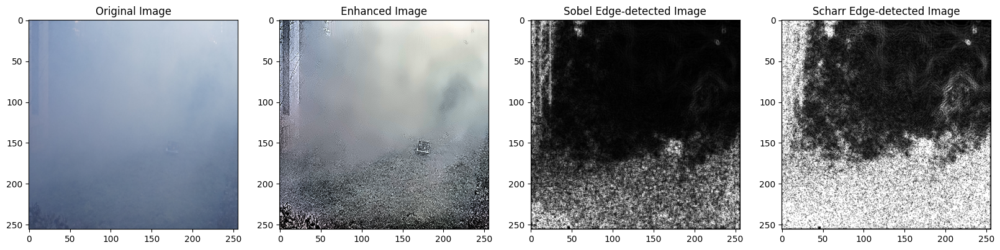

Checking if files exist for 08_hazy_2.png:
Original image exists: True
Enhanced image exists: True
Sobel edge-detected image exists: True
Scharr edge-detected image exists: True
Original image path: /content/drive/My Drive/edge_detecting/data/processed/08_hazy_2.png
Enhanced image path: /content/drive/My Drive/edge_detecting/data/enhanced/08_hazy_2.png
Sobel edge-detected image path: /content/drive/My Drive/edge_detecting/data/edge_detected_sobel/08_hazy_2.png
Scharr edge-detected image path: /content/drive/My Drive/edge_detecting/data/edge_detected_scharr/08_hazy_2.png


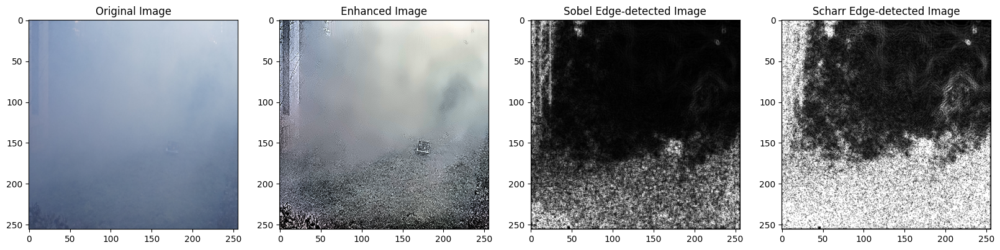

Checking if files exist for 08_hazy_3.png:
Original image exists: True
Enhanced image exists: True
Sobel edge-detected image exists: True
Scharr edge-detected image exists: True
Original image path: /content/drive/My Drive/edge_detecting/data/processed/08_hazy_3.png
Enhanced image path: /content/drive/My Drive/edge_detecting/data/enhanced/08_hazy_3.png
Sobel edge-detected image path: /content/drive/My Drive/edge_detecting/data/edge_detected_sobel/08_hazy_3.png
Scharr edge-detected image path: /content/drive/My Drive/edge_detecting/data/edge_detected_scharr/08_hazy_3.png


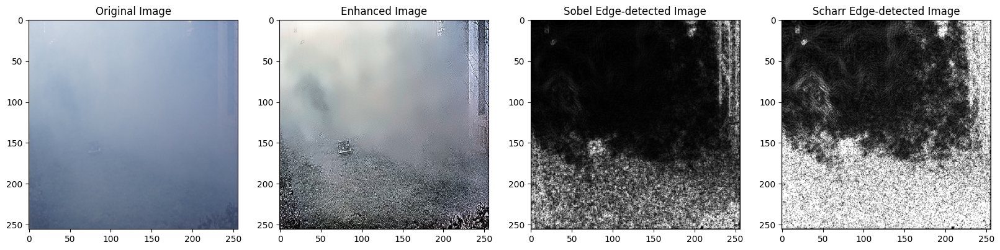

Checking if files exist for 19_hazy_1.png:
Original image exists: True
Enhanced image exists: True
Sobel edge-detected image exists: True
Scharr edge-detected image exists: True
Original image path: /content/drive/My Drive/edge_detecting/data/processed/19_hazy_1.png
Enhanced image path: /content/drive/My Drive/edge_detecting/data/enhanced/19_hazy_1.png
Sobel edge-detected image path: /content/drive/My Drive/edge_detecting/data/edge_detected_sobel/19_hazy_1.png
Scharr edge-detected image path: /content/drive/My Drive/edge_detecting/data/edge_detected_scharr/19_hazy_1.png


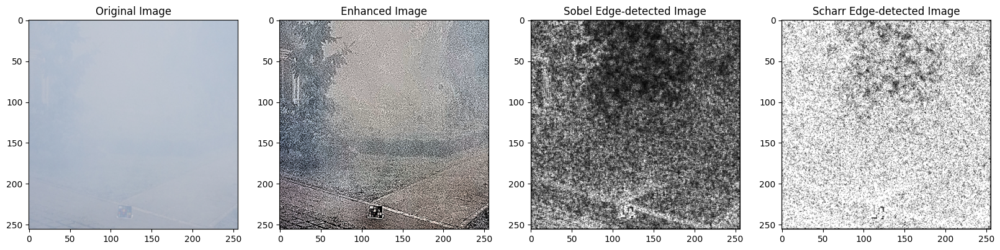

Checking if files exist for 19_hazy_2.png:
Original image exists: True
Enhanced image exists: True
Sobel edge-detected image exists: True
Scharr edge-detected image exists: True
Original image path: /content/drive/My Drive/edge_detecting/data/processed/19_hazy_2.png
Enhanced image path: /content/drive/My Drive/edge_detecting/data/enhanced/19_hazy_2.png
Sobel edge-detected image path: /content/drive/My Drive/edge_detecting/data/edge_detected_sobel/19_hazy_2.png
Scharr edge-detected image path: /content/drive/My Drive/edge_detecting/data/edge_detected_scharr/19_hazy_2.png


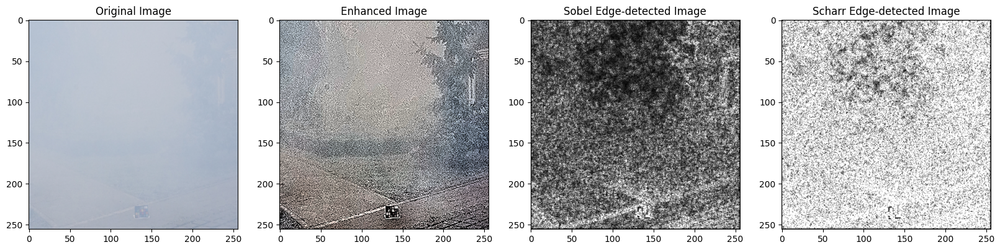

In [ ]:
import cv2
import matplotlib.pyplot as plt
import os

def detect_edges_sobel(image):
    """
    Detects edges in the input image using the Sobel edge detection algorithm.

    Parameters:
    - image: numpy array, the input image.

    Returns:
    - edges: numpy array, the edge-detected image.
    """
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    grad_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    grad_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    abs_grad_x = cv2.convertScaleAbs(grad_x)
    abs_grad_y = cv2.convertScaleAbs(grad_y)
    edges = cv2.addWeighted(abs_grad_x, 0.5, abs_grad_y, 0.5, 0)
    return edges

def detect_edges_scharr(image):
    """
    Detects edges in the input image using the Scharr edge detection algorithm.

    Parameters:
    - image: numpy array, the input image.

    Returns:
    - edges: numpy array, the edge-detected image.
    """
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    grad_x = cv2.Scharr(gray, cv2.CV_64F, 1, 0)
    grad_y = cv2.Scharr(gray, cv2.CV_64F, 0, 1)
    abs_grad_x = cv2.convertScaleAbs(grad_x)
    abs_grad_y = cv2.convertScaleAbs(grad_y)
    edges = cv2.addWeighted(abs_grad_x, 0.5, abs_grad_y, 0.5, 0)
    return edges

def enhance_and_detect_edges(image_path, output_path_sobel, output_path_scharr):
    """
    Enhances the image and then detects edges using the Sobel and Scharr edge detection algorithms.

    Parameters:
    - image_path: str, path to the input image.
    - output_path_sobel: str, path to save the Sobel edge-detected image.
    - output_path_scharr: str, path to save the Scharr edge-detected image.
    """
    try:
        image = cv2.imread(image_path)
        if image is None:
            print(f"Error: Could not load image {image_path}.")
            return

        # Assuming these functions exist and are defined elsewhere
        sharpened_image = sharpen_image(image)
        contrast_adjusted_image = adjust_contrast(sharpened_image)
        dehazed_denoised_image = dehaze_and_denoise_image(contrast_adjusted_image)

        edges_sobel = detect_edges_sobel(dehazed_denoised_image)
        edges_scharr = detect_edges_scharr(dehazed_denoised_image)

        cv2.imwrite(output_path_sobel, edges_sobel)
        cv2.imwrite(output_path_scharr, edges_scharr)
        print(f"Sobel and Scharr edge-detected images saved to {output_path_sobel} and {output_path_scharr}.")
    except Exception as e:
        print(f"Exception occurred while enhancing and detecting edges in image {image_path}: {str(e)}")

def display_edge_detection_results(original_image_path, enhanced_image_path, edge_image_path_sobel, edge_image_path_scharr):
    """
    Displays the original, enhanced, and edge-detected images side by side.

    Parameters:
    - original_image_path: str, path to the original image.
    - enhanced_image_path: str, path to the enhanced image.
    - edge_image_path_sobel: str, path to the Sobel edge-detected image.
    - edge_image_path_scharr: str, path to the Scharr edge-detected image.
    """
    print(f"Original image path: {original_image_path}")
    print(f"Enhanced image path: {enhanced_image_path}")
    print(f"Sobel edge-detected image path: {edge_image_path_sobel}")
    print(f"Scharr edge-detected image path: {edge_image_path_scharr}")

    original_image = cv2.imread(original_image_path)
    enhanced_image = cv2.imread(enhanced_image_path)
    edge_image_sobel = cv2.imread(edge_image_path_sobel, cv2.IMREAD_GRAYSCALE)
    edge_image_scharr = cv2.imread(edge_image_path_scharr, cv2.IMREAD_GRAYSCALE)

    if original_image is None:
        print(f"Error: Could not load original image from {original_image_path}.")
    if enhanced_image is None:
        print(f"Error: Could not load enhanced image from {enhanced_image_path}.")
    if edge_image_sobel is None:
        print(f"Error: Could not load Sobel edge-detected image from {edge_image_path_sobel}.")
    if edge_image_scharr is None:
        print(f"Error: Could not load Scharr edge-detected image from {edge_image_path_scharr}.")

    if original_image is not None and enhanced_image is not None and edge_image_sobel is not None and edge_image_scharr is not None:
        plt.figure(figsize=(20, 5))
        plt.subplot(1, 4, 1)
        plt.title('Original Image')
        plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))

        plt.subplot(1, 4, 2)
        plt.title('Enhanced Image')
        plt.imshow(cv2.cvtColor(enhanced_image, cv2.COLOR_BGR2RGB))

        plt.subplot(1, 4, 3)
        plt.title('Sobel Edge-detected Image')
        plt.imshow(edge_image_sobel, cmap='gray')

        plt.subplot(1, 4, 4)
        plt.title('Scharr Edge-detected Image')
        plt.imshow(edge_image_scharr, cmap='gray')

        plt.show()
    else:
        print("Error: One or more images could not be loaded for display.")

# Set up directories
data_dir = '/content/drive/My Drive/edge_detecting/data/processed'
enhanced_dir = '/content/drive/My Drive/edge_detecting/data/enhanced'
edge_detected_dir_sobel = '/content/drive/My Drive/edge_detecting/data/edge_detected_sobel'
edge_detected_dir_scharr = '/content/drive/My Drive/edge_detecting/data/edge_detected_scharr'

# Create directories if they don't exist
if not os.path.exists(edge_detected_dir_sobel):
    os.makedirs(edge_detected_dir_sobel)
if not os.path.exists(edge_detected_dir_scharr):
    os.makedirs(edge_detected_dir_scharr)

# Process all images for Sobel and Scharr edge detection
for filename in os.listdir(data_dir):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        input_path = os.path.join(data_dir, filename)
        output_path_sobel = os.path.join(edge_detected_dir_sobel, filename)
        output_path_scharr = os.path.join(edge_detected_dir_scharr, filename)
        enhance_and_detect_edges(input_path, output_path_sobel, output_path_scharr)

# Display a few sample edge-detected images using Sobel and Scharr
sample_filenames = os.listdir(data_dir)[:5]  # Change this number to display more or fewer images

for sample_filename in sample_filenames:
    original_sample_path = os.path.join(data_dir, sample_filename)
    enhanced_sample_path = os.path.join(enhanced_dir, sample_filename)
    edge_detected_sample_path_sobel = os.path.join(edge_detected_dir_sobel, sample_filename)
    edge_detected_sample_path_scharr = os.path.join(edge_detected_dir_scharr, sample_filename)

    # Check if files exist
    print(f"Checking if files exist for {sample_filename}:")
    print(f"Original image exists: {os.path.exists(original_sample_path)}")
    print(f"Enhanced image exists: {os.path.exists(enhanced_sample_path)}")
    print(f"Sobel edge-detected image exists: {os.path.exists(edge_detected_sample_path_sobel)}")
    print(f"Scharr edge-detected image exists: {os.path.exists(edge_detected_sample_path_scharr)}")

    display_edge_detection_results(
        original_sample_path,
        enhanced_sample_path,
        edge_detected_sample_path_sobel,
        edge_detected_sample_path_scharr
    )


In [ ]:
import cv2
import numpy as np

def sharpen_image(image):
    """
    Sharpens the input image using a kernel.

    Parameters:
    - image: numpy array, the input image.

    Returns:
    - sharpened_image: numpy array, the sharpened image.
    """
    kernel = np.array([[0, -1, 0],
                       [-1, 5,-1],
                       [0, -1, 0]])
    sharpened_image = cv2.filter2D(image, -1, kernel)
    return sharpened_image

def adjust_contrast(image, alpha=1.5, beta=0):
    """
    Adjusts the contrast of the input image.

    Parameters:
    - image: numpy array, the input image.
    - alpha: float, contrast control (1.0-3.0).
    - beta: int, brightness control (0-100).

    Returns:
    - adjusted_image: numpy array, the contrast-adjusted image.
    """
    adjusted_image = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
    return adjusted_image

def dehaze_and_denoise_image(image):
    """
    Applies dehazing and denoising to the input image.

    Parameters:
    - image: numpy array, the input image.

    Returns:
    - dehazed_denoised_image: numpy array, the dehazed and denoised image.
    """
    # Dehazing
    dehaze = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    lab_planes = cv2.split(lab)
    lab_planes[0] = dehaze.apply(lab_planes[0])
    lab = cv2.merge(lab_planes)
    dehazed_image = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)

    # Denoising
    dehazed_denoised_image = cv2.fastNlMeansDenoisingColored(dehazed_image, None, 10, 10, 7, 21)
    return dehazed_denoised_image


Enhanced and edge-detected image saved to /content/drive/My Drive/edge_detecting/data/edge_detected_canny/08_hazy_1.png.
Enhanced and edge-detected image saved to /content/drive/My Drive/edge_detecting/data/edge_detected_canny/08_hazy_2.png.
Enhanced and edge-detected image saved to /content/drive/My Drive/edge_detecting/data/edge_detected_canny/08_hazy_3.png.
Enhanced and edge-detected image saved to /content/drive/My Drive/edge_detecting/data/edge_detected_canny/19_hazy_1.png.
Enhanced and edge-detected image saved to /content/drive/My Drive/edge_detecting/data/edge_detected_canny/19_hazy_2.png.
Enhanced and edge-detected image saved to /content/drive/My Drive/edge_detecting/data/edge_detected_canny/19_hazy_3.png.
Enhanced and edge-detected image saved to /content/drive/My Drive/edge_detecting/data/edge_detected_canny/10_hazy_1.png.
Enhanced and edge-detected image saved to /content/drive/My Drive/edge_detecting/data/edge_detected_canny/10_hazy_2.png.
Enhanced and edge-detected image

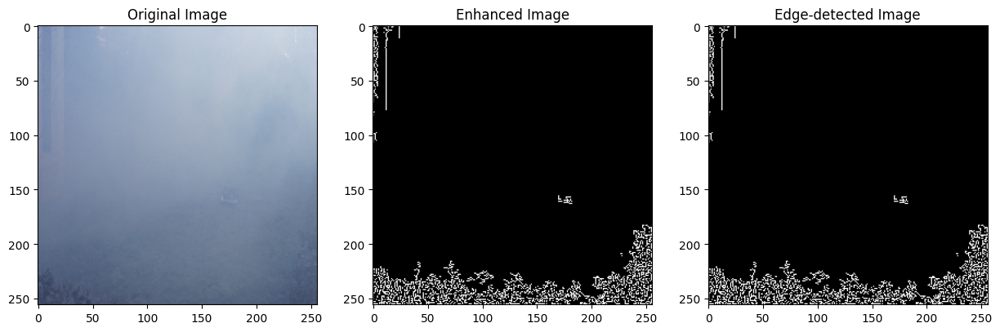

In [ ]:
import os
import cv2
import numpy as np
from matplotlib import pyplot as plt

def sharpen_image(image):
    kernel = np.array([[0, -1, 0], [-1, 5,-1], [0, -1, 0]])
    sharpened_image = cv2.filter2D(image, -1, kernel)
    return sharpened_image

def adjust_contrast(image, alpha=1.5, beta=0):
    adjusted_image = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
    return adjusted_image

def dehaze_and_denoise_image(image):
    dehaze = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    l = dehaze.apply(l)
    lab = cv2.merge((l, a, b))
    dehazed_image = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
    dehazed_denoised_image = cv2.fastNlMeansDenoisingColored(dehazed_image, None, 10, 10, 7, 21)
    return dehazed_denoised_image

def detect_edges_canny(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, threshold1=50, threshold2=150)
    return edges

def enhance_and_detect_edges_canny(image_path, output_path):
    try:
        image = cv2.imread(image_path)
        if image is None:
            print(f"Error: Could not load image from {image_path}.")
            return

        sharpened_image = sharpen_image(image)
        contrast_adjusted_image = adjust_contrast(sharpened_image)
        dehazed_denoised_image = dehaze_and_denoise_image(contrast_adjusted_image)

        edges = detect_edges_canny(dehazed_denoised_image)

        cv2.imwrite(output_path, edges)
        print(f"Enhanced and edge-detected image saved to {output_path}.")
    except Exception as e:
        print(f"Exception occurred while enhancing and detecting edges in image {image_path}: {str(e)}")

data_dir = '/content/drive/My Drive/edge_detecting/data/processed'
edge_detected_dir_canny = '/content/drive/My Drive/edge_detecting/data/edge_detected_canny'

if not os.path.exists(edge_detected_dir_canny):
    os.makedirs(edge_detected_dir_canny)

for filename in os.listdir(data_dir):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        input_path = os.path.join(data_dir, filename)
        output_path = os.path.join(edge_detected_dir_canny, filename)
        enhance_and_detect_edges_canny(input_path, output_path)

def display_edge_detection_results_canny(original_image_path, enhanced_image_path, edge_image_path):
    original_image = cv2.imread(original_image_path)
    enhanced_image = cv2.imread(enhanced_image_path)
    edge_image = cv2.imread(edge_image_path, cv2.IMREAD_GRAYSCALE)

    if original_image is None:
        print(f"Error: Could not load original image from {original_image_path}.")
    if enhanced_image is None:
        print(f"Error: Could not load enhanced image from {enhanced_image_path}.")
    if edge_image is None:
        print(f"Error: Could not load edge-detected image from {edge_image_path}.")

    if original_image is not None and enhanced_image is not None and edge_image is not None:
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 3, 1)
        plt.title('Original Image')
        plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))

        plt.subplot(1, 3, 2)
        plt.title('Enhanced Image')
        plt.imshow(cv2.cvtColor(enhanced_image, cv2.COLOR_BGR2RGB))

        plt.subplot(1, 3, 3)
        plt.title('Edge-detected Image')
        plt.imshow(edge_image, cmap='gray')

        plt.show()
    else:
        print("Error: One or more images could not be loaded for display.")

sample_filename = os.listdir(data_dir)[0]
enhanced_sample_path = os.path.join(edge_detected_dir_canny, sample_filename)
edge_detected_sample_path_canny = os.path.join(edge_detected_dir_canny, sample_filename)

print(f"Checking if files exist:")
print(f"Original image exists: {os.path.exists(os.path.join(data_dir, sample_filename))}")
print(f"Enhanced image exists: {os.path.exists(enhanced_sample_path)}")
print(f"Edge-detected image exists: {os.path.exists(edge_detected_sample_path_canny)}")

display_edge_detection_results_canny(
    os.path.join(data_dir, sample_filename),
    enhanced_sample_path,
    edge_detected_sample_path_canny
)
